In [1]:
import meld

In [2]:
from sotip import *
import numpy as np
import scanpy as sc


In [3]:
def random_spatial(num_cells,x_range,y_range):
# num_cells = adata_sub.shape[0]
# x_range = (0,100)
# y_range = (0,100)

    x_random = np.random.random(size=(num_cells,))*(x_range[1]-x_range[0])+x_range[0]
    y_random = np.random.random(size=(num_cells,))*(y_range[1]-y_range[0])+y_range[0]
    spatial_mat = np.vstack([x_random,y_random]).transpose()
    return  spatial_mat


In [4]:
adata = sc.read_h5ad('simulation_data/simulation5.h5ad')

In [39]:
adata.rename_categories('gt_ct', ['Group1','Group2','Group3'])

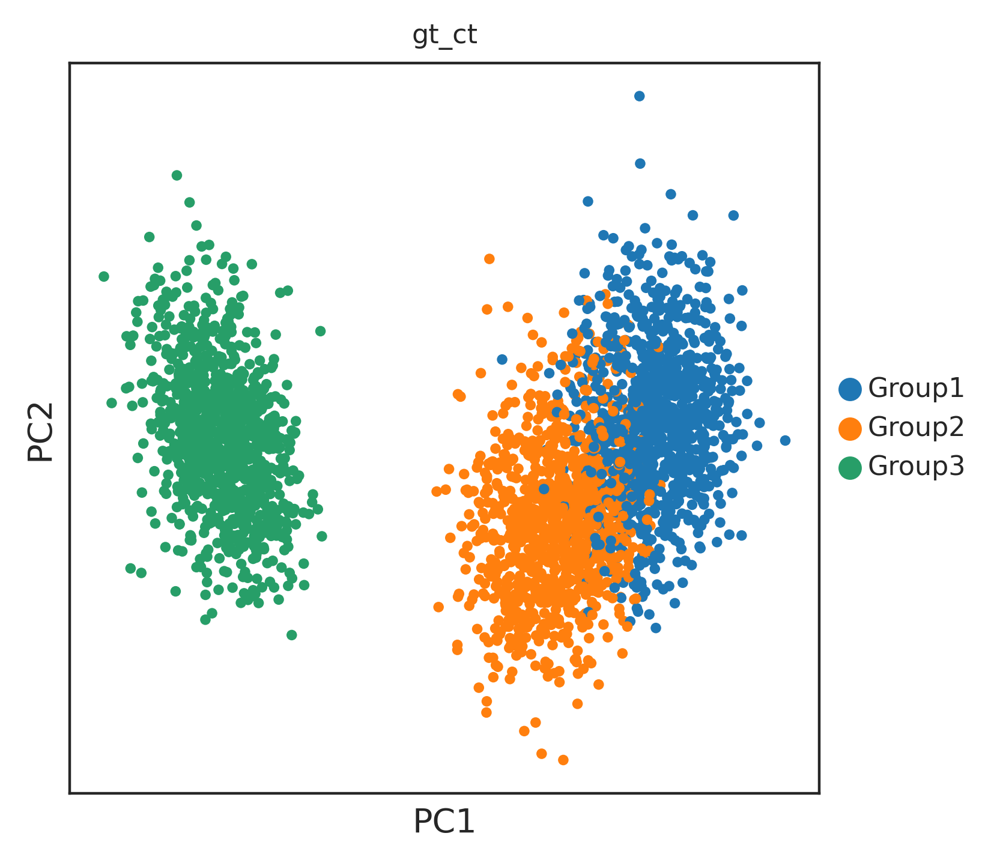

In [40]:
sc.pl.pca(adata,color='gt_ct')

In [41]:
def get_adata_by_order(order,adata_source):
    adata = adata_source.copy()
    order_ct = [f'Group{i}' for i in order]
    spatial_mat = np.zeros(shape=(adata.shape[0],2))
    for i in range(len(order_ct)):
        ct = order_ct[i]
        cur_ct_id = np.where(adata.obs['gt_ct']==ct)[0]
        cur_num_cells = len(cur_ct_id)
        cur_spatial = random_spatial(cur_num_cells,[30*(i),30*(i+1)],[0,90])
        spatial_mat[cur_ct_id] = cur_spatial
        # region_array[cur_ct_id] =  
    adata.obsm['spatial'] = spatial_mat
    return adata

In [42]:
adata1 = get_adata_by_order([1,2,3],adata)
adata2 = get_adata_by_order([2,3,1],adata)


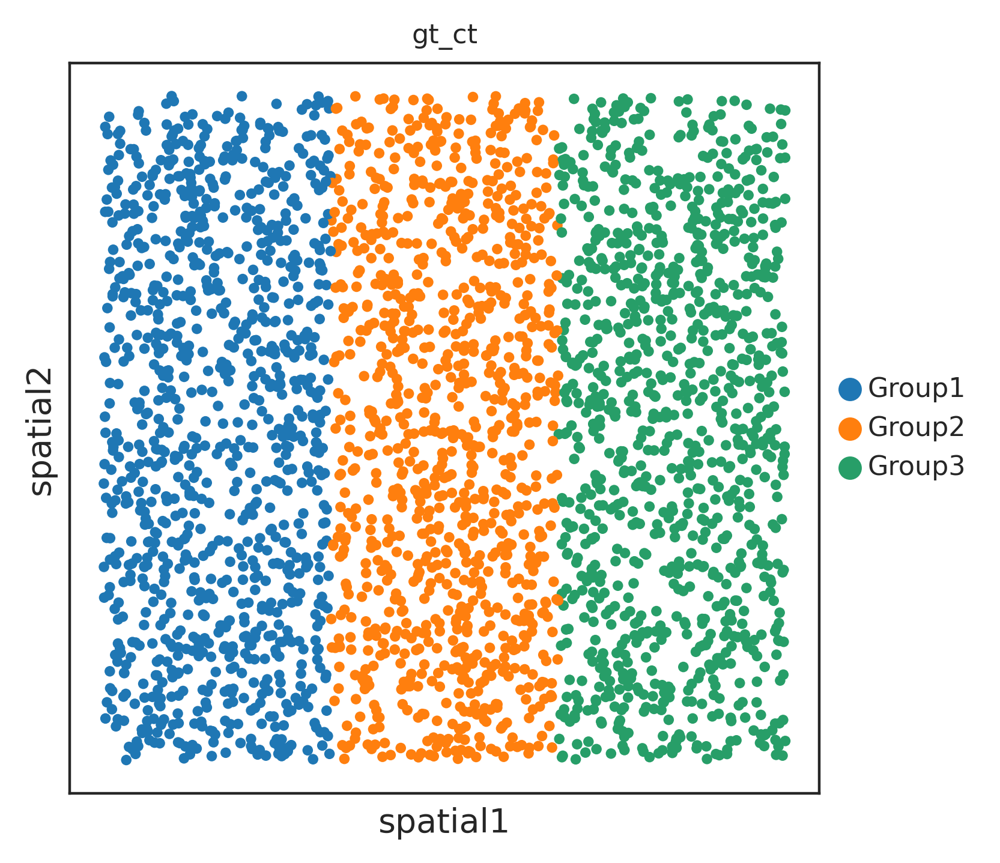

In [43]:
sc.pl.embedding(adata1,basis='spatial',color='gt_ct')

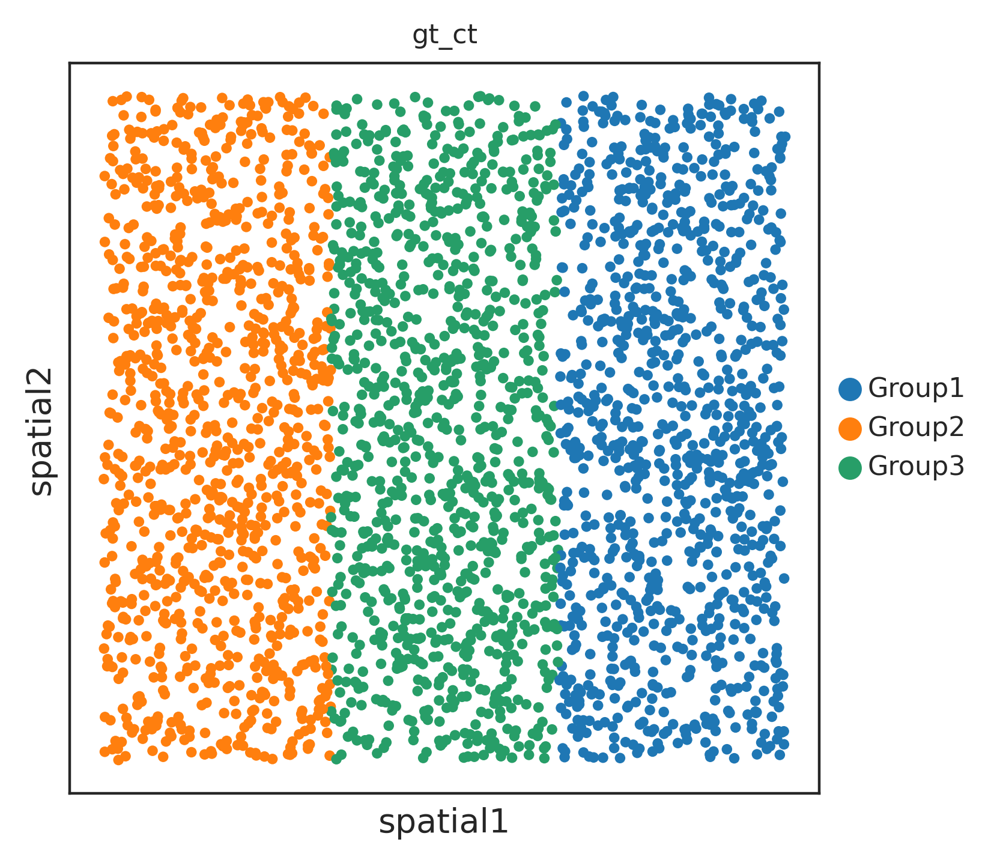

In [44]:
sc.pl.embedding(adata2,basis='spatial',color='gt_ct')

In [ ]:
adata = adata1.concatenate([adata2])

In [46]:
sc.pp.pca(adata)
sc.pp.neighbors(adata)
sc.tl.umap(adata)



knn search time cost 0.02173328399658203 s
0 MEs,time cost 1.6689300537109375e-06 s, 3009 MEs, 5.021810531616211e-06s left
1000 MEs,time cost 0.14369440078735352 s, 2009 MEs, 0.2886820511817932s left
2000 MEs,time cost 0.15331649780273438 s, 1009 MEs, 0.15469634628295897s left
3000 MEs,time cost 0.16334819793701172 s, 9 MEs, 0.0014701337814331055s left
knn search time cost 0.021242380142211914 s
0 MEs,time cost 1.9073486328125e-06 s, 3009 MEs, 5.739212036132812e-06s left
1000 MEs,time cost 0.14752697944641113 s, 2009 MEs, 0.29638170170783995s left
2000 MEs,time cost 0.1629335880279541 s, 1009 MEs, 0.1643999903202057s left
3000 MEs,time cost 0.15086746215820312 s, 9 MEs, 0.001357807159423828s left


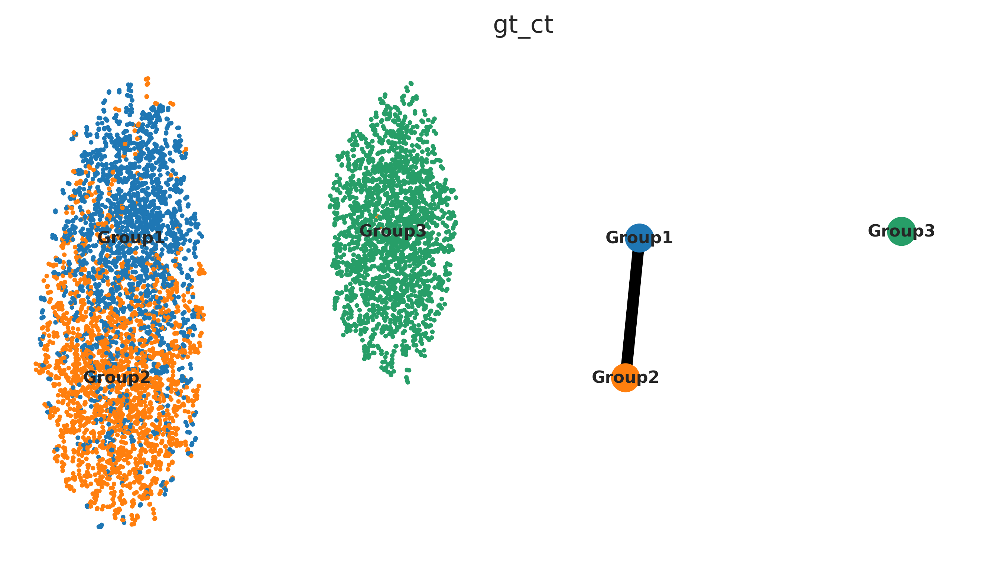

In [48]:
knn = 50
spatial_var='spatial'
cls_key='gt_ct'
ME_var_names_np_unique = np.unique(adata.obs[cls_key]) 
MED_multi(adata,use_cls=cls_key,nn=knn,copy=False,spatial_var=spatial_var,batch_obs='batch')
# MED(adata,use_cls=cls_key,nn=knn,copy=False,ME_var_names_np_unique=ME_var_names_np_unique,spatial_var=spatial_var) 
sc.tl.paga(adata,groups=cls_key)
sc.pl.paga_compare(adata,basis='X_umap')    


In [43]:
adata

AnnData object with n_obs × n_vars = 6000 × 1000
    obs: 'gt_ct', 'batch'
    uns: 'pca', 'neighbors', 'umap', 'gt_ct_colors', 'paga', 'gt_ct_sizes'
    obsm: 'spatial', 'X_pca', 'X_umap', 'ME'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

In [49]:
# gd_method = 'euclidean'
gd_method = 'paga_guided_umap'


gd = get_ground_distance(adata,method=gd_method,cls_key=cls_key,embed_key=None,connect_threshold=0.5)  



In [50]:
heter_key = 'ME_heter_{0}_{1}'.format(cls_key,gd_method)
cal_ME_heterogeneity(adata,copy=False,key_added=heter_key) 

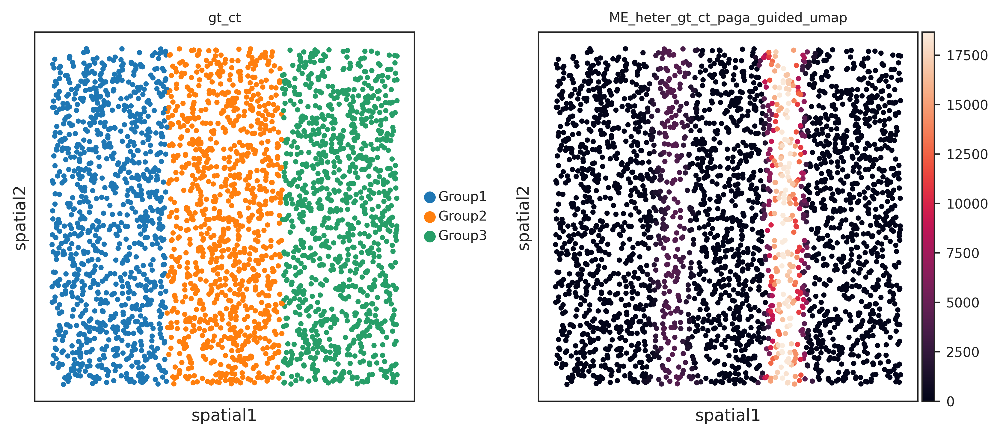

In [51]:
sc.pl.embedding(adata[adata.obs['batch']=='0'],basis='spatial',color=['gt_ct',heter_key])

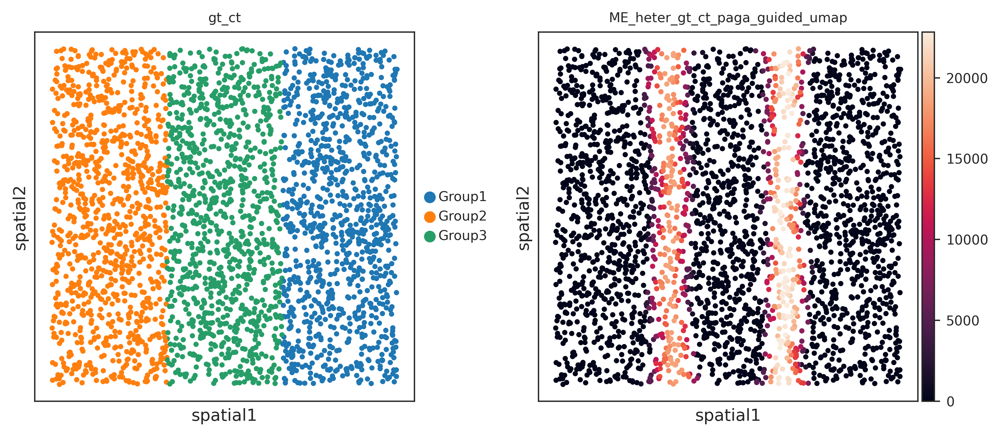

In [52]:
sc.pl.embedding(adata[adata.obs['batch']=='1'],basis='spatial',color=['gt_ct',heter_key])

In [53]:
adata_phEMD = MED_phEMD(
    adata.copy(),
    GD_method=gd_method,
    MED_knn=knn,
    CT_obs=cls_key,
    ifspatialplot=False,
    OT_method='pyemd',
    ME_precompyted=True,
    GD_precomputed=True
)


0 1657123787.9103503
100 14.446366310119629
200 14.244417428970337
300 13.974108457565308
400 13.659832954406738
500 13.42781138420105
600 13.149200439453125
700 12.788428783416748
800 12.478398084640503
900 12.331612348556519
1000 12.17586350440979
1100 11.9246666431427
1200 11.640511989593506
1300 11.49696683883667
1400 11.229465007781982
1500 10.982625246047974
1600 10.70237684249878
1700 10.431701898574829
1800 10.15674877166748
1900 9.907798290252686
2000 9.628314733505249
2100 9.473871946334839
2200 9.25069260597229
2300 9.012876987457275
2400 8.785794734954834
2500 8.61830735206604
2600 8.266303539276123
2700 8.049101829528809
2800 7.843799114227295
2900 7.565651178359985
3000 7.348629474639893
3100 7.08746600151062
3200 6.873207330703735
3300 6.62059760093689
3400 6.381283283233643
3500 6.16985297203064
3600 5.9096245765686035
3700 5.64894437789917
3800 5.342867374420166
3900 5.1227006912231445
4000 4.936843156814575
4100 4.701230049133301
4200 4.453188896179199
4300 4.19565272

In [54]:
import graphtools as gt

In [ ]:
emd_distmat = (adata_phEMD.obsm['X_ME_EMD_mat'])

G = gt.Graph(emd_distmat,precomputed='distance',knn=100)

In [56]:
meld_op = meld.MELD()
sample_densities = meld_op.fit_transform(G, sample_labels=adata.obs['batch'])

Building graph on precomputed distance matrix with 6018 samples.


In [57]:
sample_densities

,0,1
0,0.000163,0.000169
1,0.000169,0.000163
2,0.000159,0.000174
3,0.000159,0.000174
4,0.000158,0.000174
...,...,...
6013,0.000169,0.000163
6014,0.000159,0.000174
6015,0.000146,0.000186
6016,0.000019,0.000313


In [58]:
adata.obs['DMA_0'] = sample_densities.values[:,0]
adata.obs['DMA_1'] = sample_densities.values[:,1]

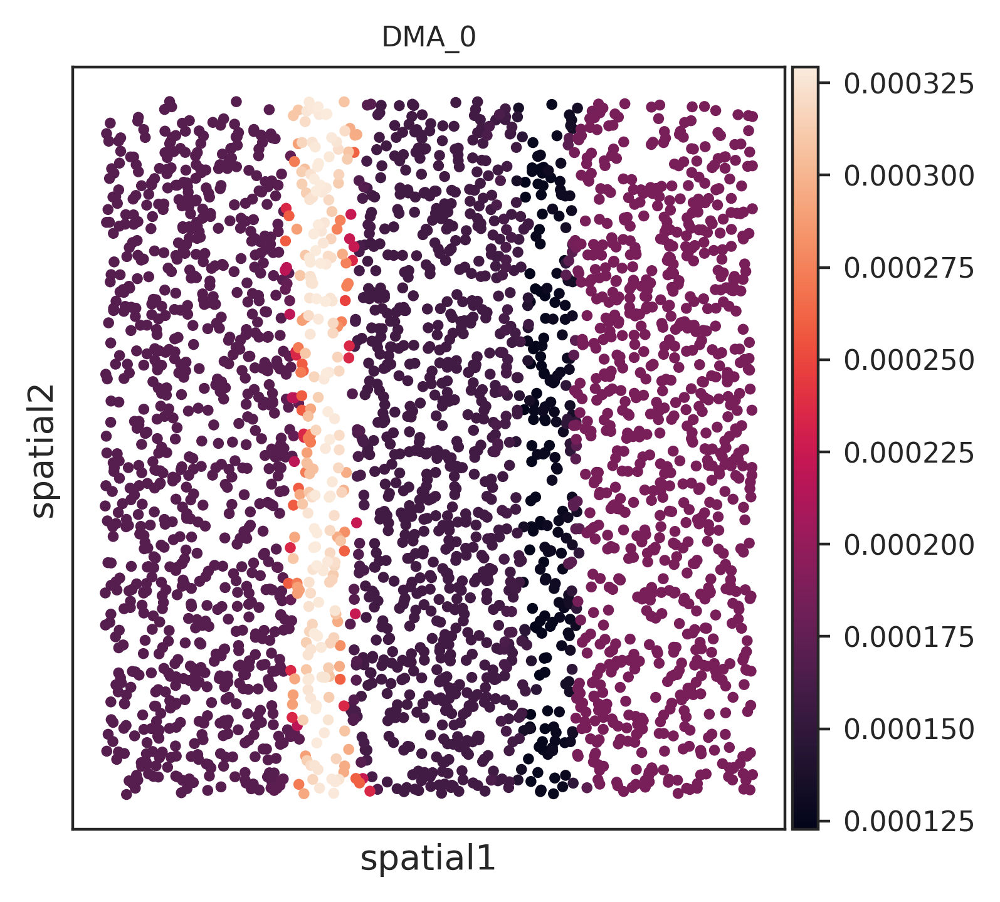

In [59]:
sc.pl.embedding(adata[adata.obs['batch']=='0'],basis='spatial',color=['DMA_0'])

Text(0.5, 1.0, '125_heter')

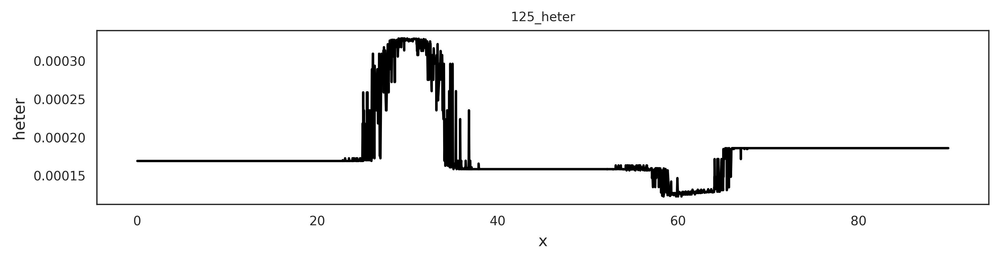

In [60]:
adata_use = adata[adata.obs['batch']=='0']

spatial_mat = adata_use.obsm['spatial']
heter_array = adata_use.obs['DMA_0']
pd_dict = {
    'x':spatial_mat[:,0],
    'y':spatial_mat[:,1],
    'heter':heter_array
}
pd_df = pd.DataFrame(pd_dict)
fig,ax = plt.subplots(1,1,figsize=(10,2))
ax = sns.lineplot(x="x", y="heter",
             # hue="method", 
             # data=pd_df[pd_df['method']!='sum'],
             data=pd_df,
             color='k'
                  
                  # c='k'
            )
plt.title('125_heter')
# ax.get_legend().remove()

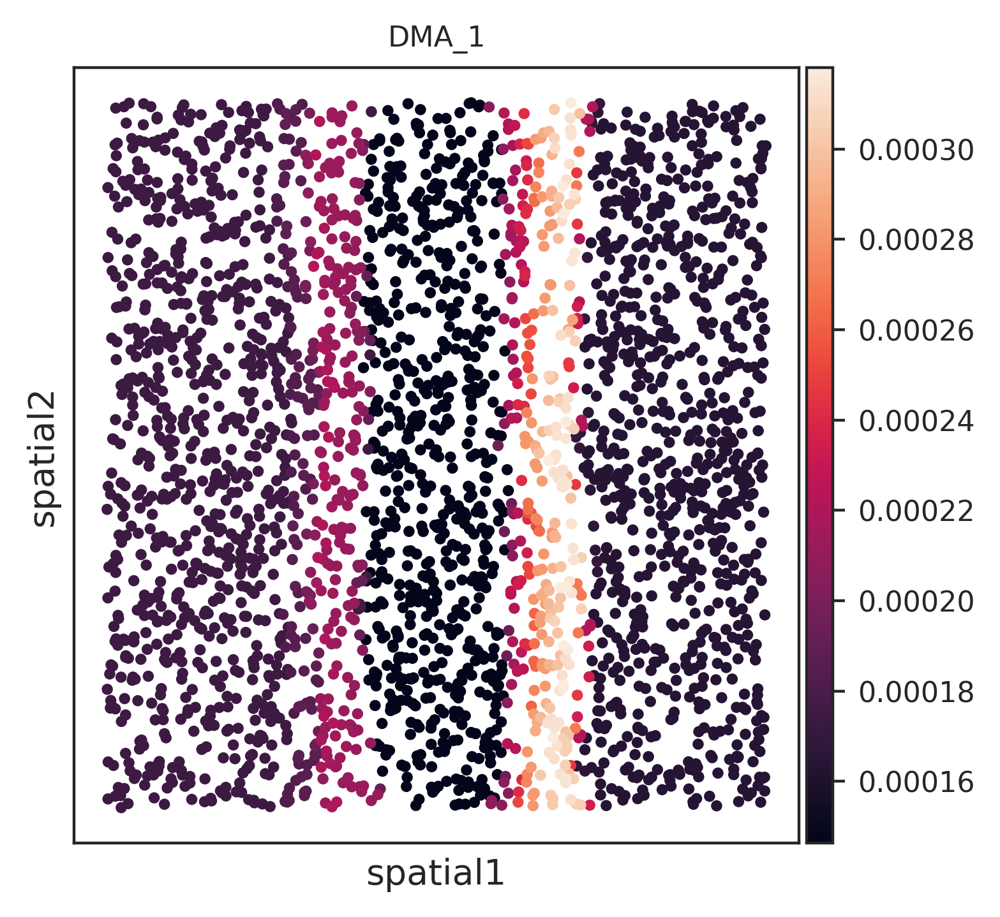

In [61]:
sc.pl.embedding(adata[adata.obs['batch']=='1'],basis='spatial',color=['DMA_1'])

Text(0.5, 1.0, '125_heter')

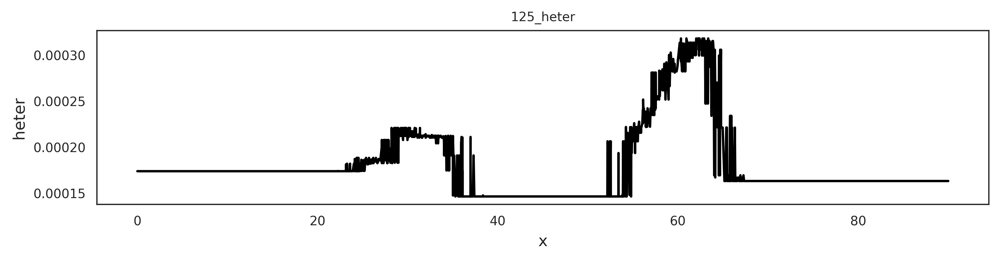

In [62]:
adata_use = adata[adata.obs['batch']=='1']

spatial_mat = adata_use.obsm['spatial']
heter_array = adata_use.obs['DMA_1']
pd_dict = {
    'x':spatial_mat[:,0],
    'y':spatial_mat[:,1],
    'heter':heter_array
}
pd_df = pd.DataFrame(pd_dict)
fig,ax = plt.subplots(1,1,figsize=(10,2))
ax = sns.lineplot(x="x", y="heter",
             # hue="method", 
             # data=pd_df[pd_df['method']!='sum'],
             data=pd_df,
             color='k'
                  
                  # c='k'
            )
plt.title('125_heter')
# ax.get_legend().remove()

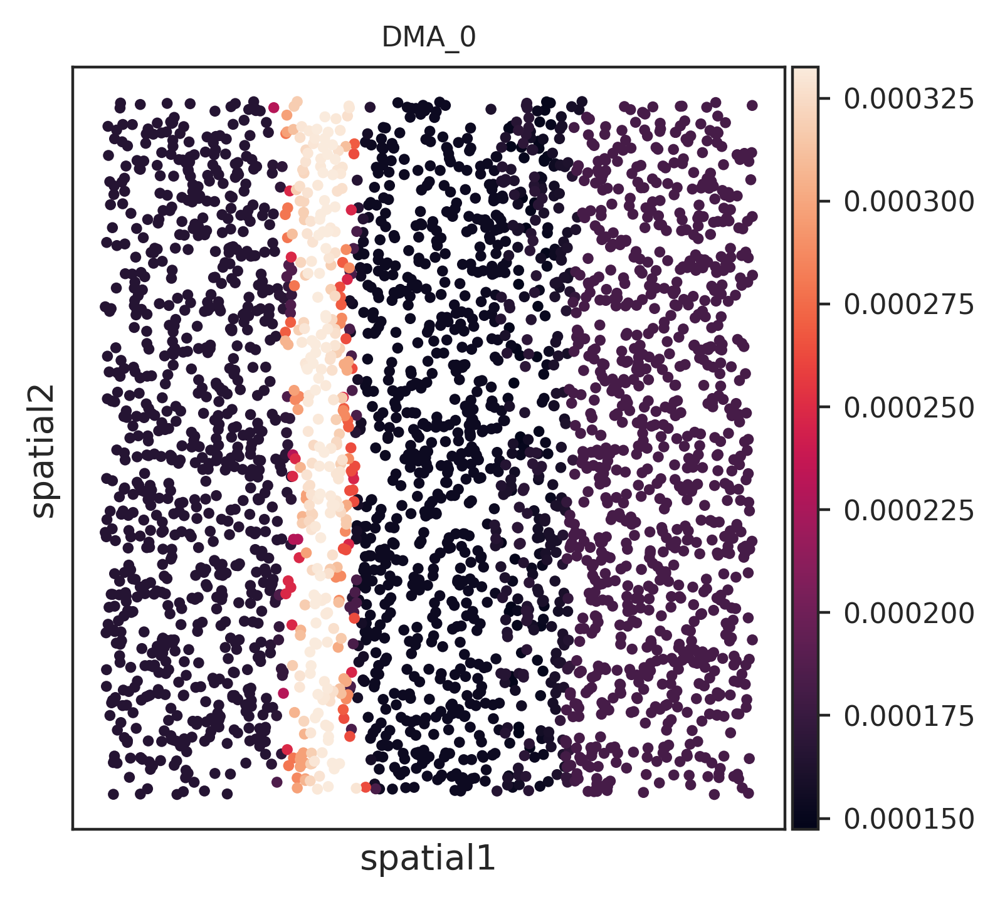

In [123]:
sc.pl.embedding(adata[adata.obs['batch']=='0'],basis='spatial',color=['DMA_0'])